In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from seysmo.models.model_class import CNN, CNNLSTMNetwork, CNNLSTMNetwork2
from seysmo.models.train_model import train, evaluate
from seysmo.models.utils import save_model, load_model, count_parameters, EarlyStopper, SignalSpeedDataset, give_data
from seysmo.visualization.plotting import plot_map
from seysmo.features.mapping import do_array_for_mapping, compute_y_pred
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchinfo import summary
from torchmetrics import MeanAbsolutePercentageError

import mlflow

mlflow.set_tracking_uri("http://localhost:5000")

In [2]:
X_train, y_train, coord_train, X_val, y_val, coord_val, X_test, y_test, coord_test = give_data(
    '../data/processed/coord_dict.pkl')

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
in_channels = 1
out_channels = 16
conv_kernel_size = 5
stride = 2
padding = 1
hidden_size = 128
num_layers = 2
dropout = 0.2
linear_input_size = 64
linear_output_size = 10
input_shape = X_train[0].shape
epochs = 70
batch_size = 32
learning_rate = 0.001
patience = 3
min_delta = 30
loss_fn = nn.MSELoss()
metric_fn = MeanAbsolutePercentageError().to(device)
model0 = CNNLSTMNetwork(in_channels=in_channels, out_channels=out_channels, kernel_size=conv_kernel_size, stride=stride,
                        padding=padding, hidden_size=hidden_size, num_layers=num_layers, dropout=dropout,
                        linear_input_size=linear_input_size, linear_output_size=linear_output_size,
                        input_shape=input_shape).to(device)
early_stopper = EarlyStopper(patience=patience, min_delta=min_delta)
optimizer = torch.optim.Adam(model0.parameters(), lr=learning_rate)

In [4]:
train_dataset = SignalSpeedDataset(X_train, y_train)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataset = SignalSpeedDataset(X_val, y_val)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
test_dataset = SignalSpeedDataset(X_test, y_test)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [5]:
mlflow.set_experiment("/CNNLSTM_v0.1")

<Experiment: artifact_location='mlflow-artifacts:/536689916772439481', creation_time=1721906761771, experiment_id='536689916772439481', last_update_time=1721906761771, lifecycle_stage='active', name='/CNNLSTM_v0.1', tags={}>

In [6]:
with mlflow.start_run(run_name='first_depth') as run:
    params = {
        "epochs": epochs,
        "learning_rate": learning_rate,
        "batch_size": batch_size,
        "loss_function": loss_fn.__class__.__name__,
        "metric_function": metric_fn.__class__.__name__,
        "optimizer": "ADAM",
        "in_channels": in_channels,
        'out_channels': out_channels,
        "conv_kernel_size": conv_kernel_size,
        'stride': stride,
        'padding': padding,
        'hidden_size': hidden_size,
        'num_layers': num_layers,
        'dropout': dropout,
        'linear_input_size': linear_input_size,
        'linear_output_size': linear_output_size,
        "input_shape": input_shape,
        'patience': patience,
        'min_delta': min_delta
    }
    # Log training parameters.
    mlflow.log_params(params)

    # Log model summary.
    with open("../models/model_P_summary.txt", "w", encoding="utf-8") as f:
        f.write(str(summary(model0)))
    mlflow.log_artifact("../models/model_P_summary.txt")

    for t in range(epochs):
        print(f"Epoch {t + 1}\n-------------------------------")
        train(train_dataloader, model0, loss_fn, metric_fn, optimizer, epoch=t, device=device,
              output_size=linear_output_size)
        validation_loss, validation_mape = evaluate(val_dataloader, model0, loss_fn, metric_fn, epoch=t, device=device,
                                                    output_size=linear_output_size)

    # Save the trained model to MLflow.
    mlflow.pytorch.log_model(model0, "model")

Epoch 1
-------------------------------
loss: 129559.890625 MAPE: 1.000078 [0 / 346]
loss: 90343.140625 MAPE: 0.788030 [100 / 346]
loss: 23191.119141 MAPE: 0.293205 [200 / 346]
loss: 4251.663574 MAPE: 0.146563 [300 / 346]
Eval metrics: 
MAPE: 0.15, Avg loss: 3789.157375 

Epoch 2
-------------------------------
loss: 3435.907471 MAPE: 0.141688 [0 / 346]
loss: 3854.710938 MAPE: 0.142357 [100 / 346]
loss: 4090.753906 MAPE: 0.152741 [200 / 346]
loss: 3481.332764 MAPE: 0.134584 [300 / 346]
Eval metrics: 
MAPE: 0.14, Avg loss: 3594.992545 

Epoch 3
-------------------------------
loss: 3787.833984 MAPE: 0.141091 [0 / 346]
loss: 3894.015381 MAPE: 0.150554 [100 / 346]
loss: 2617.208984 MAPE: 0.121499 [200 / 346]
loss: 3295.338623 MAPE: 0.140260 [300 / 346]
Eval metrics: 
MAPE: 0.14, Avg loss: 3590.169366 

Epoch 4
-------------------------------
loss: 3746.193848 MAPE: 0.151580 [0 / 346]
loss: 3967.038330 MAPE: 0.129099 [100 / 346]
loss: 1897.922241 MAPE: 0.097521 [200 / 346]
loss: 1523.75073

2024/07/27 20:41:08 WARNING mlflow.utils.requirements_utils: Found torch version (2.3.1+cu118) contains a local version label (+cu118). MLflow logged a pip requirement for this package as 'torch==2.3.1' without the local version label to make it installable from PyPI. To specify pip requirements containing local version labels, please use `conda_env` or `pip_requirements`.
2024/07/27 20:41:19 WARNING mlflow.utils.requirements_utils: Found torch version (2.3.1+cu118) contains a local version label (+cu118). MLflow logged a pip requirement for this package as 'torch==2.3.1' without the local version label to make it installable from PyPI. To specify pip requirements containing local version labels, please use `conda_env` or `pip_requirements`.


In [8]:
num_batches = len(test_dataloader)
eval_loss, eval_mape = 0, 0
with torch.no_grad():
    for X, y in test_dataloader:
        X, y = X.to(device), y.to(device)
        pred = model0(X)
        eval_loss += loss_fn(torch.reshape(pred, (-1, 10)), torch.reshape(y, (-1, 10))).item()
        eval_mape += metric_fn(torch.reshape(pred, (-1, 10)), torch.reshape(y, (-1, 10))).item()

eval_loss /= num_batches
eval_mape /= num_batches
print(f"Test loss: {eval_loss:4f}")
print(f"Test MAPE: {eval_mape:4f}")

Test loss: 1031.910433
Test MAPE: 0.000000


C:\Users\vitya\AppData\Local\Temp\ipykernel_16664\1900889347.py:41: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


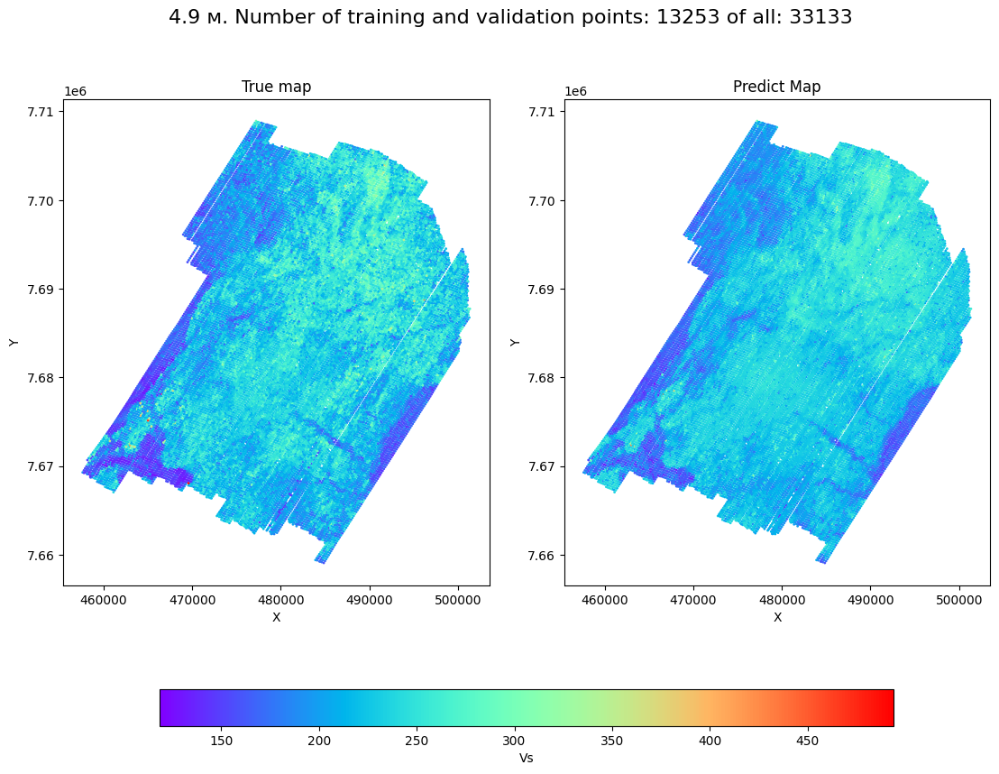

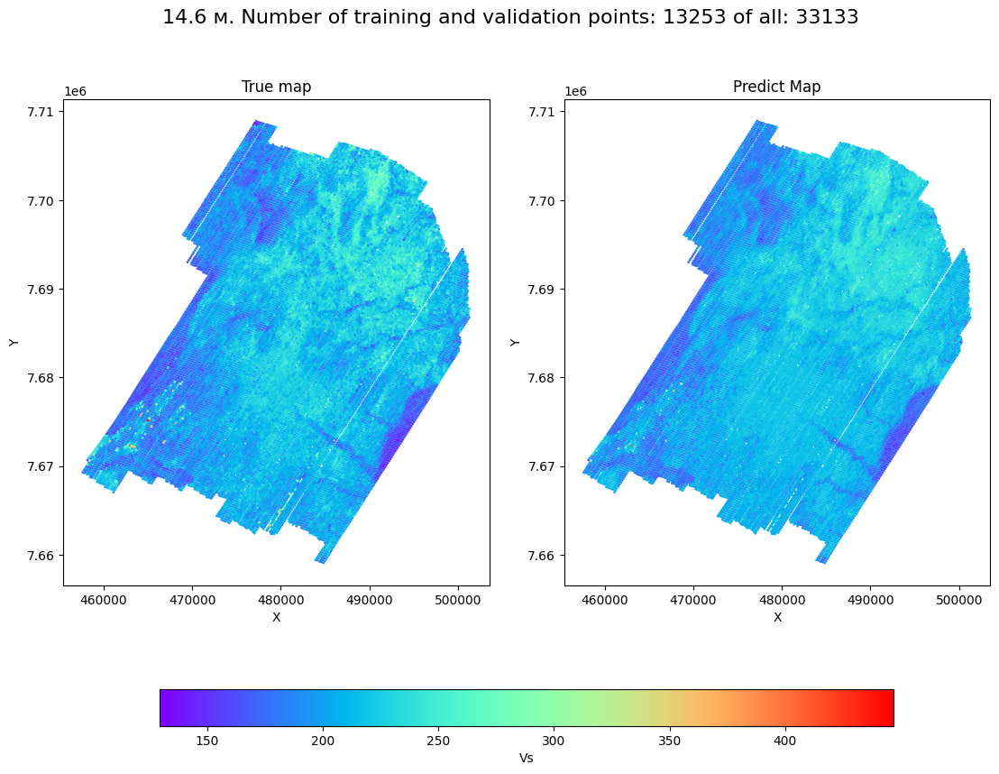

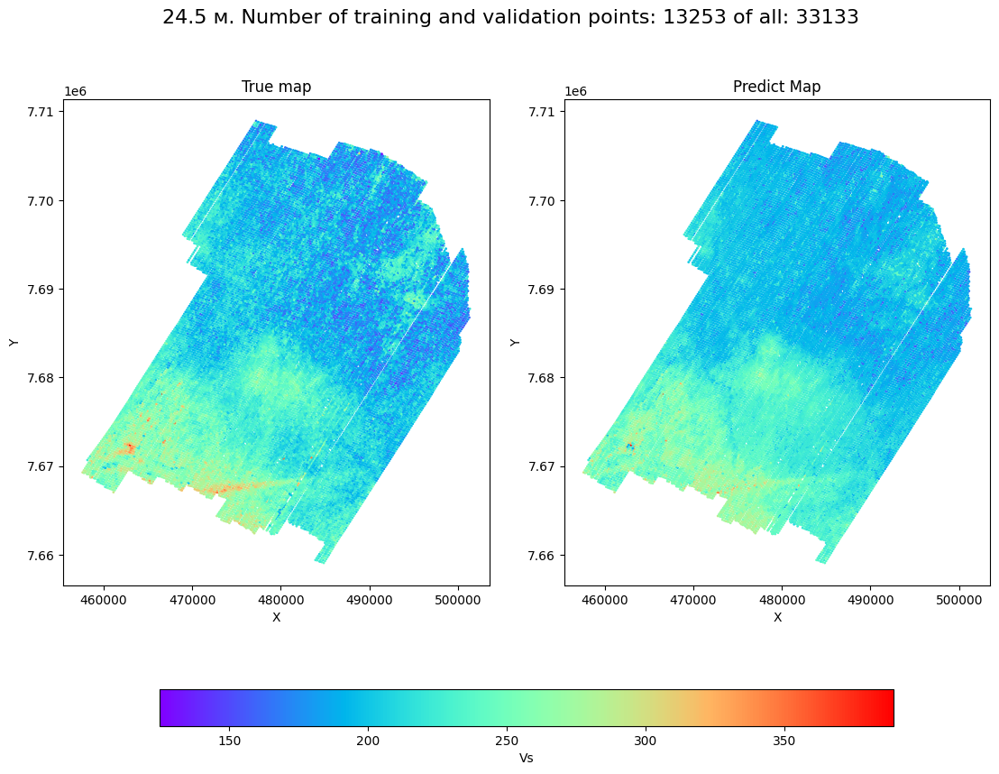

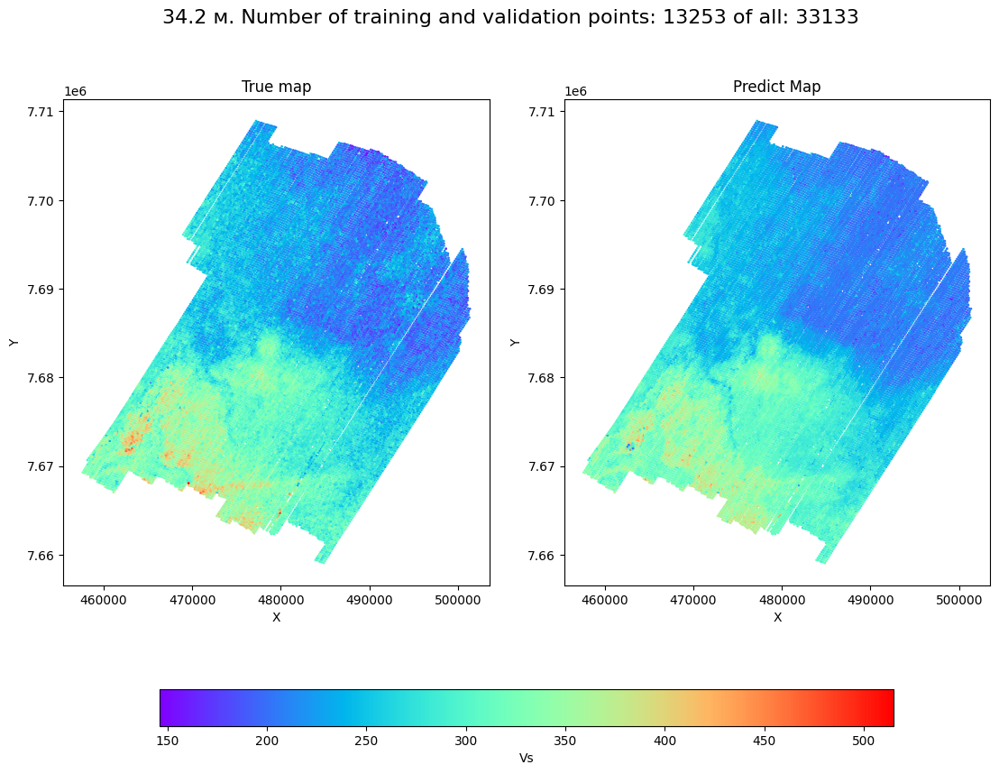

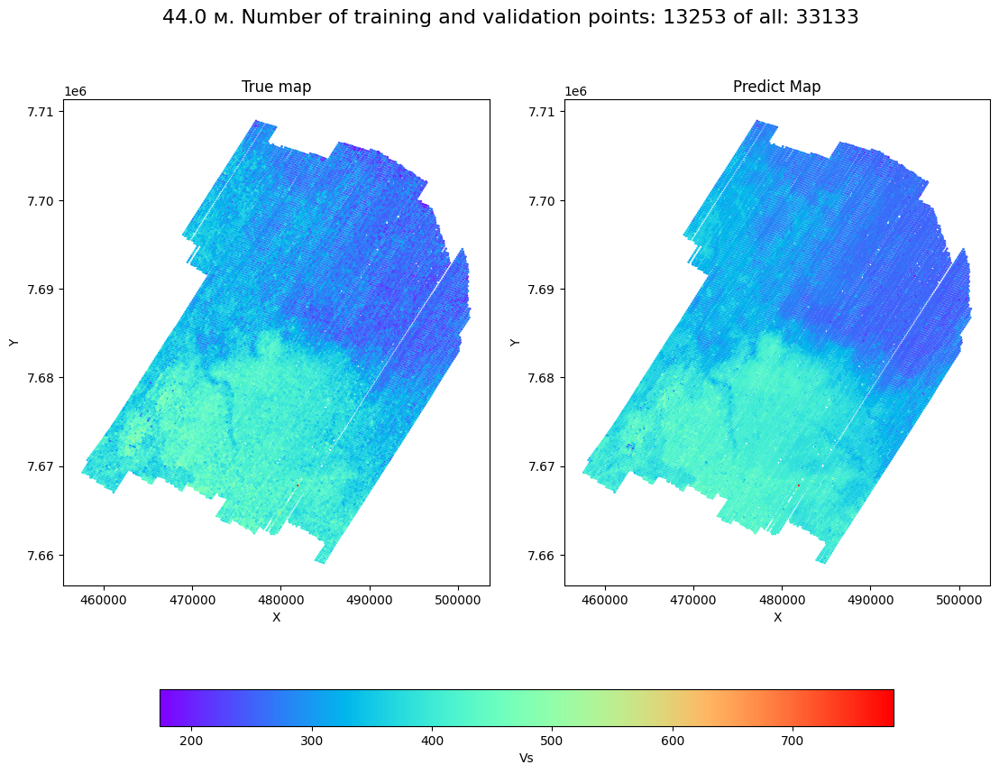

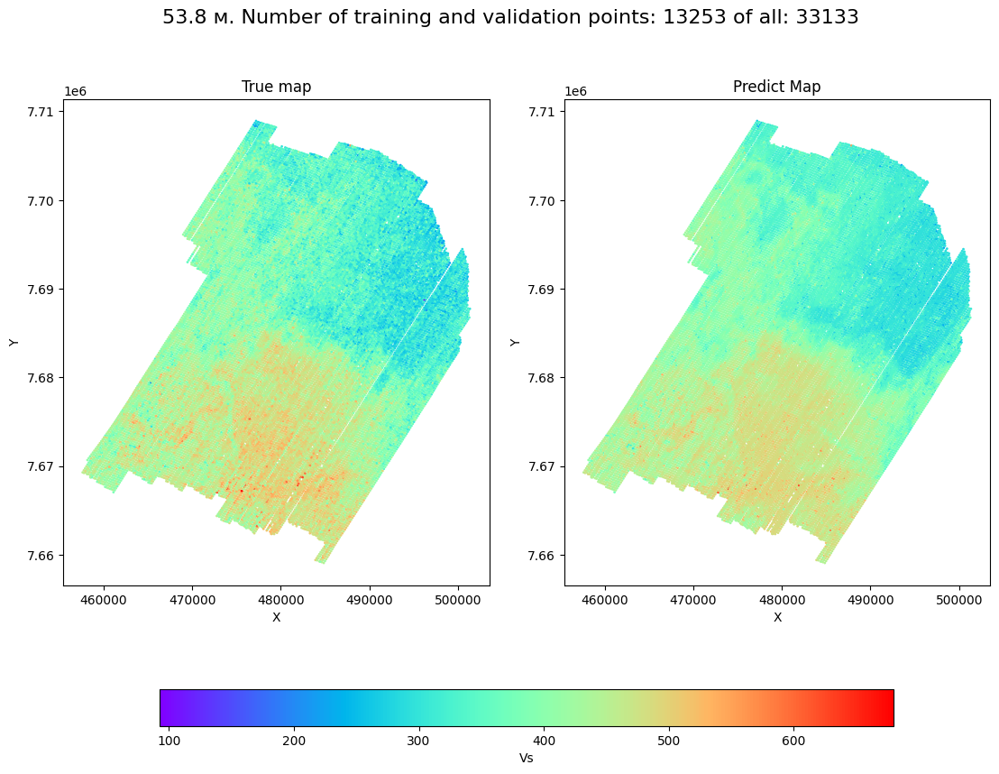

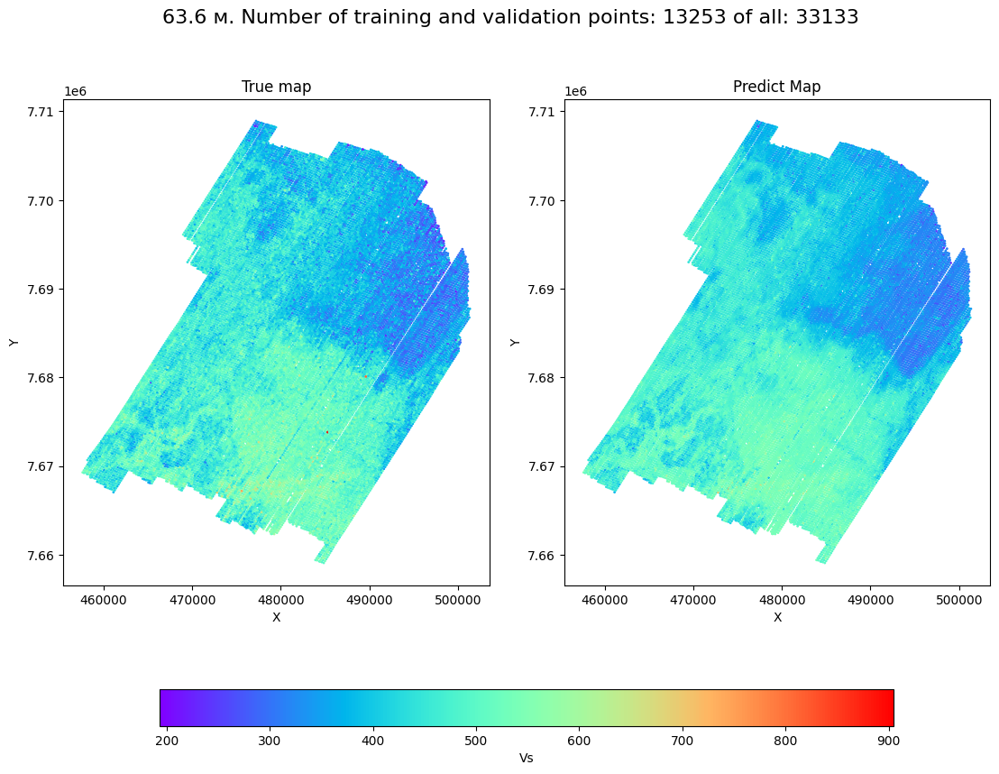

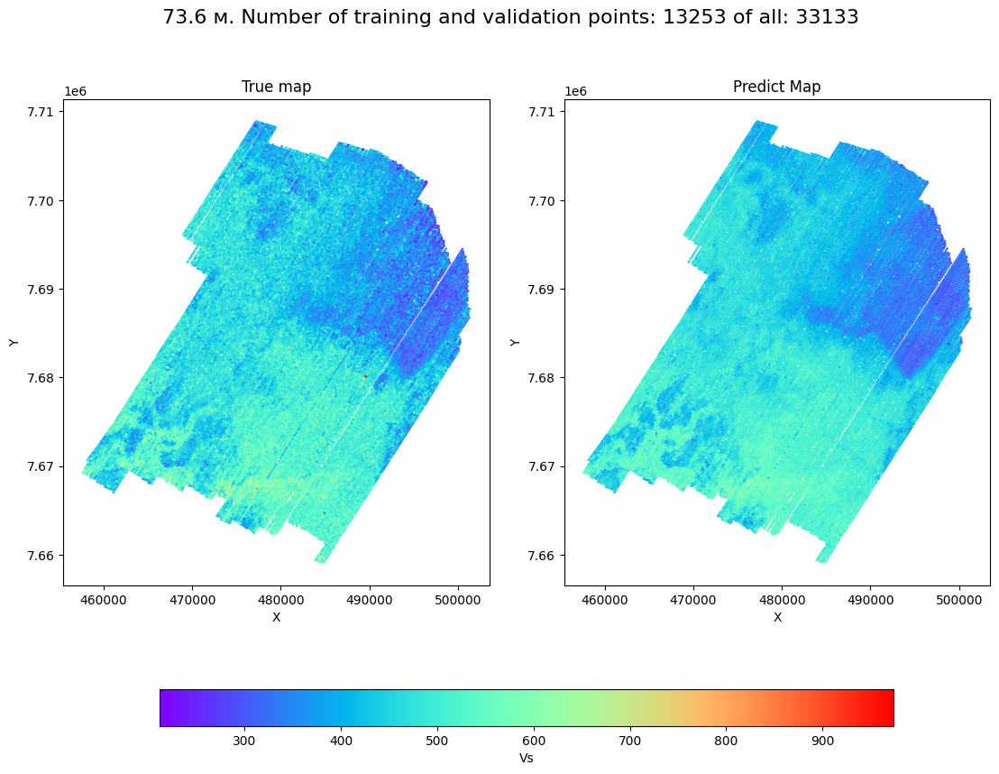

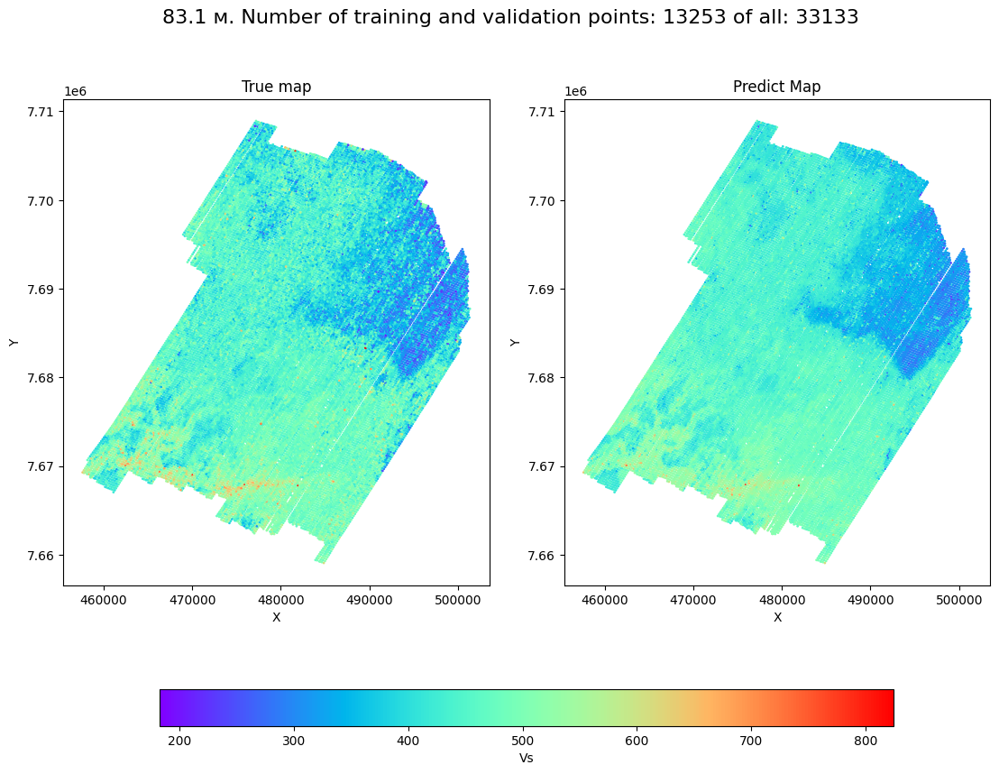

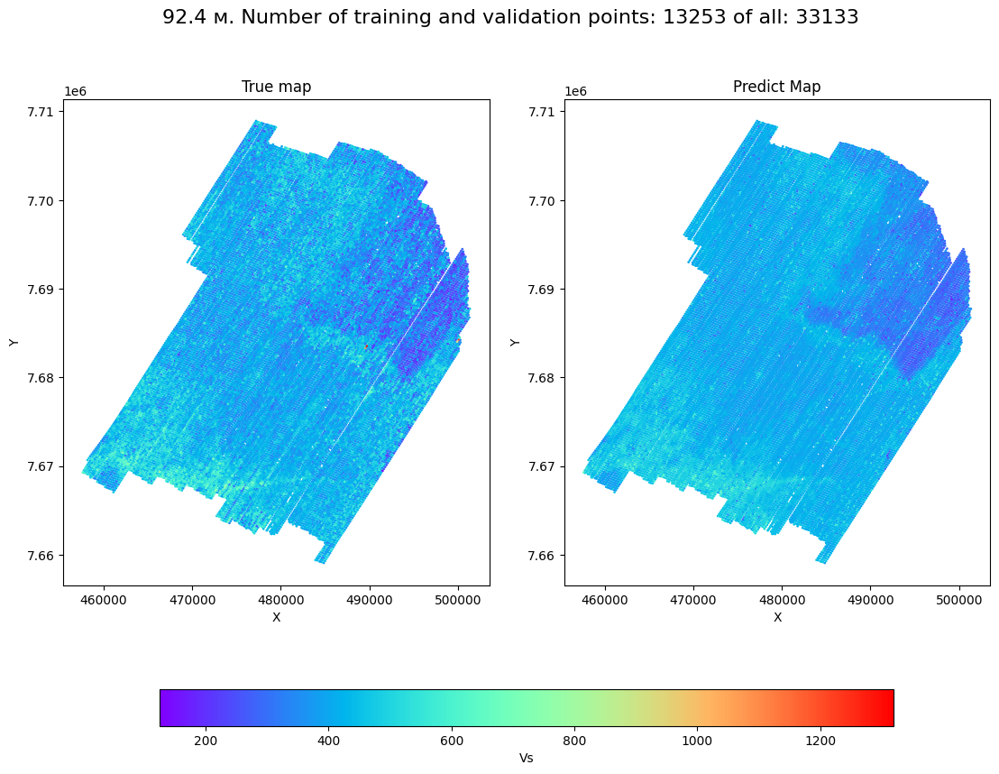

In [23]:
y_pred = None
with torch.no_grad():
    for X, y in test_dataloader:
        X, y = X.to(device), y.to(device)
        pred = model0(X).to("cpu").detach().numpy()
        if y_pred is None:
            y_pred = pred
        else:
            y_pred = np.concatenate([y_pred, pred])
depth_ar = [4.9, 14.6, 24.5, 34.2, 44.0, 53.8, 63.6, 73.6, 83.1, 92.4]
for i in range(10):
    true_slice = do_array_for_mapping(coord_train, coord_val, coord_test, y_train[:, i], y_val[:, i], y_test[:, i])
    pred_slice = do_array_for_mapping(coord_train, coord_val, coord_test, y_train[:, i], y_val[:, i], y_pred[:, i])
    our_map = plot_map(true_slice, pred_slice, depth_ar[i], X_train.shape[0], X_val.shape[0], X_test.shape[0])
    our_map.savefig(f"../reports/figures/maps/{round(depth_ar[i])}map.png")
    plt.show(our_map)

Новый эксперимент. Новая модель

In [15]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
in_channels = 1
conv_channels = [8, 16, 32]
pool_kernel_size = 2
fc_layers = [256, 128, 64, 10]
conv_kernel_size = 5
hidden_size = 128
num_layers = 4
dropout = 0.2
input_shape = X_train[0].shape
epochs = 250
batch_size = 32
learning_rate = 0.001
patience = 5
min_delta = 50
loss_fn = nn.MSELoss()
metric_fn = MeanAbsolutePercentageError().to(device)
model = CNNLSTMNetwork2(in_channels=in_channels, conv_channels=conv_channels, kernel_size=conv_kernel_size,
                         pool_size=pool_kernel_size, hidden_size=hidden_size, lstm_num_layers=num_layers,
                         dropout=dropout,
                         fc_layers=fc_layers,
                         input_shape=input_shape).to(device)
early_stopper = EarlyStopper(patience=patience, min_delta=min_delta)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [16]:
train_dataset = SignalSpeedDataset(X_train, y_train)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_dataset = SignalSpeedDataset(X_val, y_val)
val_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
test_dataset = SignalSpeedDataset(X_test, y_test)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [17]:
mlflow.set_experiment("/CNNLSTM_v0.2")

<Experiment: artifact_location='mlflow-artifacts:/790213694662806883', creation_time=1722108793547, experiment_id='790213694662806883', last_update_time=1722108793547, lifecycle_stage='active', name='/CNNLSTM_v0.2', tags={}>

In [19]:
with mlflow.start_run() as run:
    params = {
        "epochs": epochs,
        "learning_rate": learning_rate,
        "batch_size": batch_size,
        "loss_function": loss_fn.__class__.__name__,
        "metric_function": metric_fn.__class__.__name__,
        "optimizer": "ADAM",
        "in_channels": in_channels,
        'conv_channels': conv_channels,
        'pool_kernel_size':pool_kernel_size,
        'fc_layers': fc_layers,
        "conv_kernel_size": conv_kernel_size,
        'hidden_size': hidden_size,
        'num_layers': num_layers,
        'dropout': dropout,
        "input_shape": input_shape,
        'patience': patience,
        'min_delta': min_delta
    }
    # Log training parameters.
    mlflow.log_params(params)

    # Log model summary.
    with open("../models/model_P_summary.txt", "w", encoding="utf-8") as f:
        f.write(str(summary(model)))
    mlflow.log_artifact("../models/model_P_summary.txt")

    for t in range(epochs):
        print(f"Epoch {t + 1}\n-------------------------------")
        train(train_dataloader, model, loss_fn, metric_fn, optimizer, epoch=t, device=device,
              output_size=fc_layers[-1])
        validation_loss, validation_mape = evaluate(val_dataloader, model, loss_fn, metric_fn, epoch=t, device=device,
                                                    output_size=fc_layers[-1])
        # if early_stopper.early_stop(validation_loss):
        #     break

    # Save the trained model to MLflow.
    mlflow.pytorch.log_model(model, "model")

Epoch 1
-------------------------------
loss: 4351.659180 MAPE: 0.168444 [0 / 346]
loss: 3521.876221 MAPE: 0.141391 [100 / 346]
loss: 3813.878906 MAPE: 0.144722 [200 / 346]
loss: 3546.094482 MAPE: 0.154153 [300 / 346]
Eval metrics: 
MAPE: 0.14, Avg loss: 3519.399322 

Epoch 2
-------------------------------
loss: 4491.332520 MAPE: 0.159717 [0 / 346]
loss: 4028.926270 MAPE: 0.148900 [100 / 346]
loss: 2910.052246 MAPE: 0.121695 [200 / 346]
loss: 4006.404785 MAPE: 0.155966 [300 / 346]
Eval metrics: 
MAPE: 0.14, Avg loss: 3511.974549 

Epoch 3
-------------------------------
loss: 3513.387207 MAPE: 0.139384 [0 / 346]
loss: 2786.068115 MAPE: 0.115222 [100 / 346]
loss: 3238.415039 MAPE: 0.133044 [200 / 346]
loss: 2686.299561 MAPE: 0.121374 [300 / 346]
Eval metrics: 
MAPE: 0.14, Avg loss: 3528.405525 

Epoch 4
-------------------------------
loss: 4217.433594 MAPE: 0.153452 [0 / 346]
loss: 3476.143066 MAPE: 0.138617 [100 / 346]
loss: 3351.599609 MAPE: 0.124114 [200 / 346]
loss: 5142.484375 MA

2024/07/27 23:08:31 WARNING mlflow.utils.requirements_utils: Found torch version (2.3.1+cu118) contains a local version label (+cu118). MLflow logged a pip requirement for this package as 'torch==2.3.1' without the local version label to make it installable from PyPI. To specify pip requirements containing local version labels, please use `conda_env` or `pip_requirements`.


Eval metrics: 
MAPE: 0.14, Avg loss: 3496.109294 


2024/07/27 23:08:37 WARNING mlflow.utils.requirements_utils: Found torch version (2.3.1+cu118) contains a local version label (+cu118). MLflow logged a pip requirement for this package as 'torch==2.3.1' without the local version label to make it installable from PyPI. To specify pip requirements containing local version labels, please use `conda_env` or `pip_requirements`.


In [20]:
num_batches = len(test_dataloader)
eval_loss, eval_mape = 0, 0
with torch.no_grad():
    for X, y in test_dataloader:
        X, y = X.to(device), y.to(device)
        pred = model0(X)
        eval_loss += loss_fn(torch.reshape(pred, (-1, 10)), torch.reshape(y, (-1, 10))).item()
        eval_mape += metric_fn(torch.reshape(pred, (-1, 10)), torch.reshape(y, (-1, 10))).item()

eval_loss /= num_batches
eval_mape /= num_batches
print(f"Test loss: {eval_loss:4f}")
print(f"Test MAPE: {eval_mape:4f}")

Test loss: 127172.975131
Test MAPE: 1.000013


C:\Users\vitya\Work\seysmo\seysmo\visualization\plotting.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


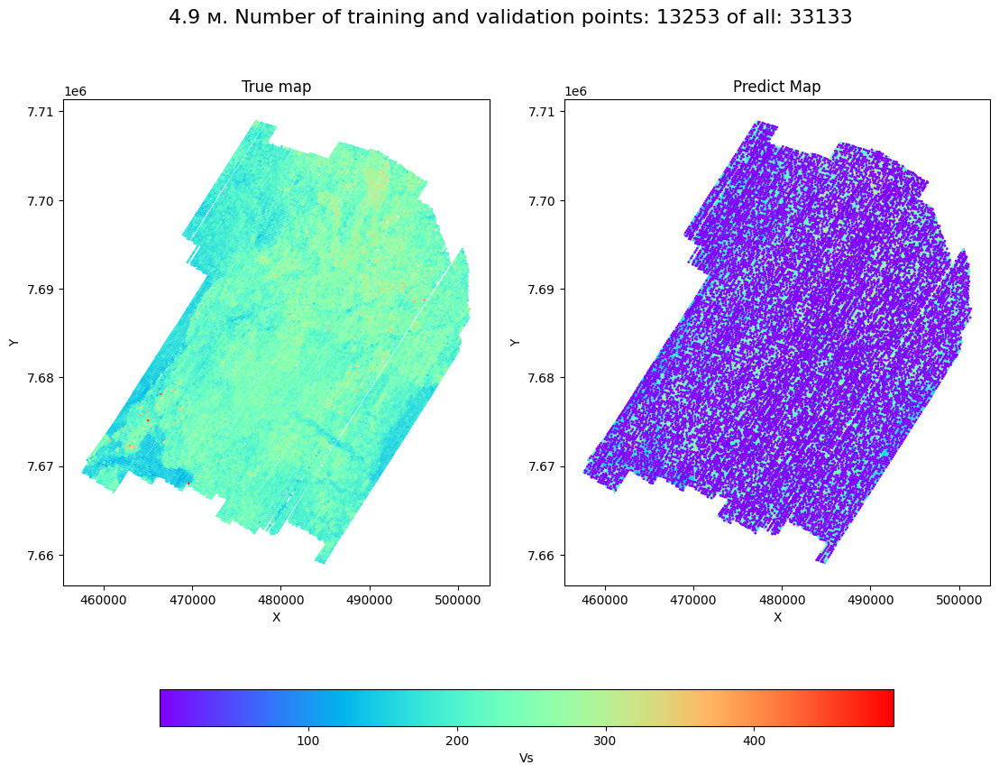

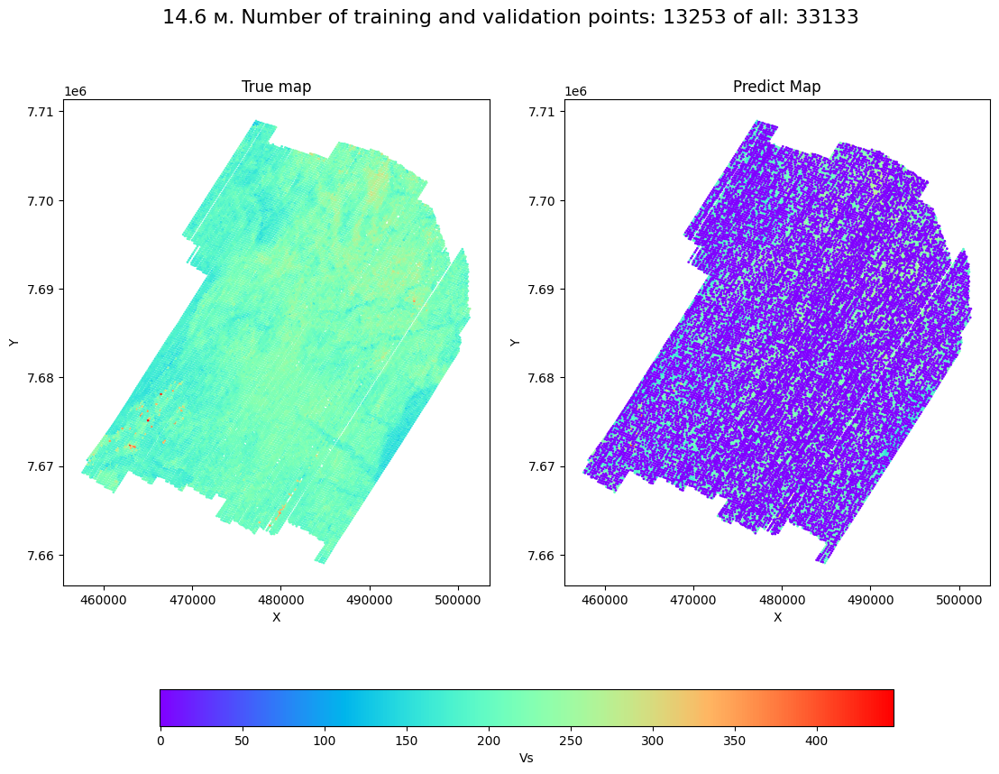

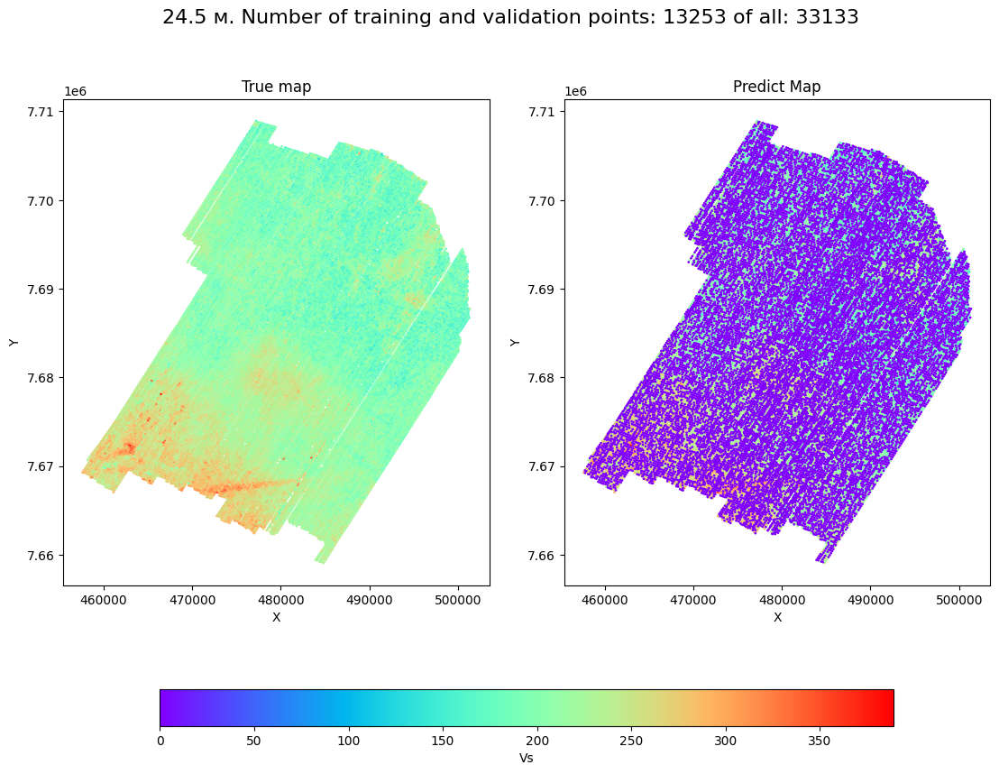

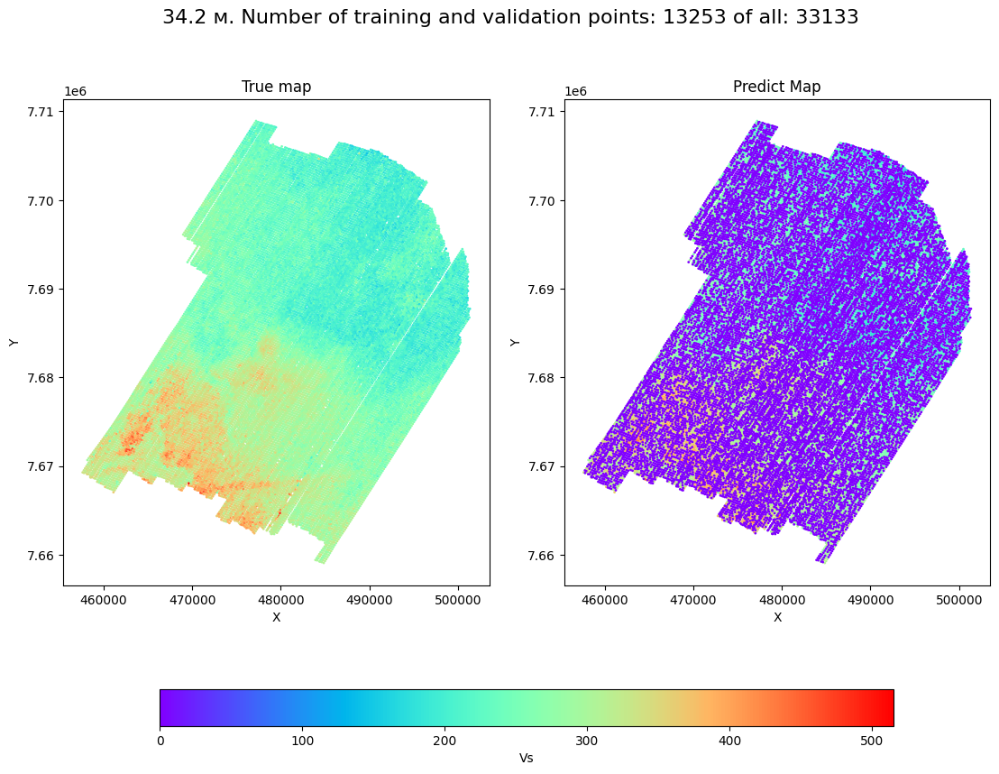

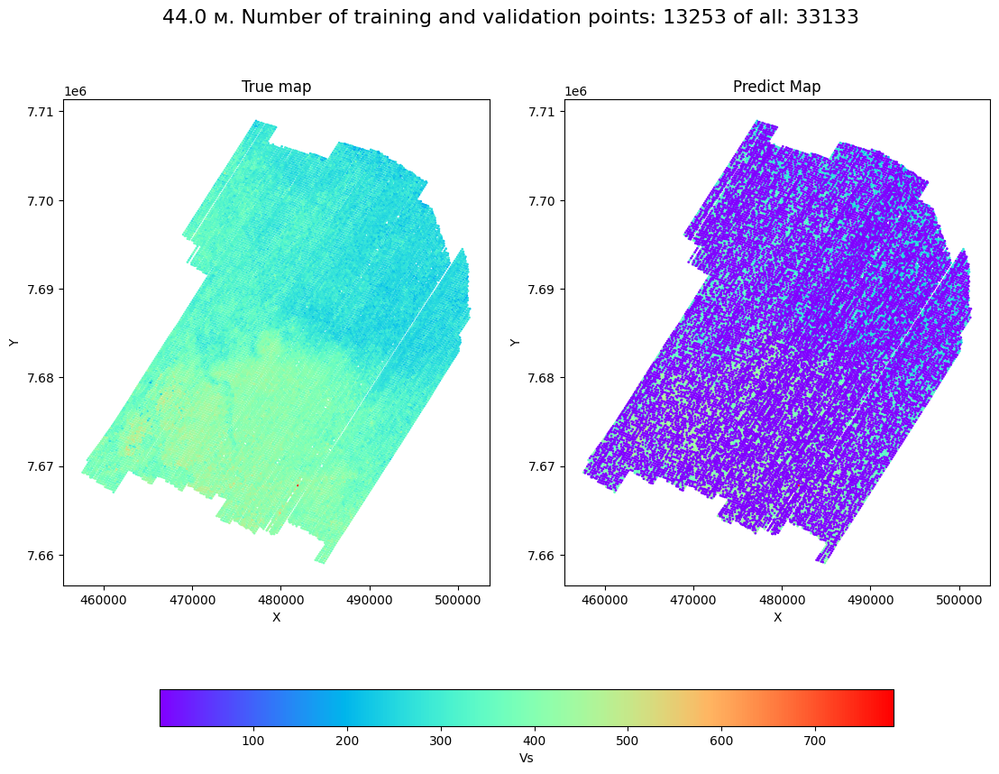

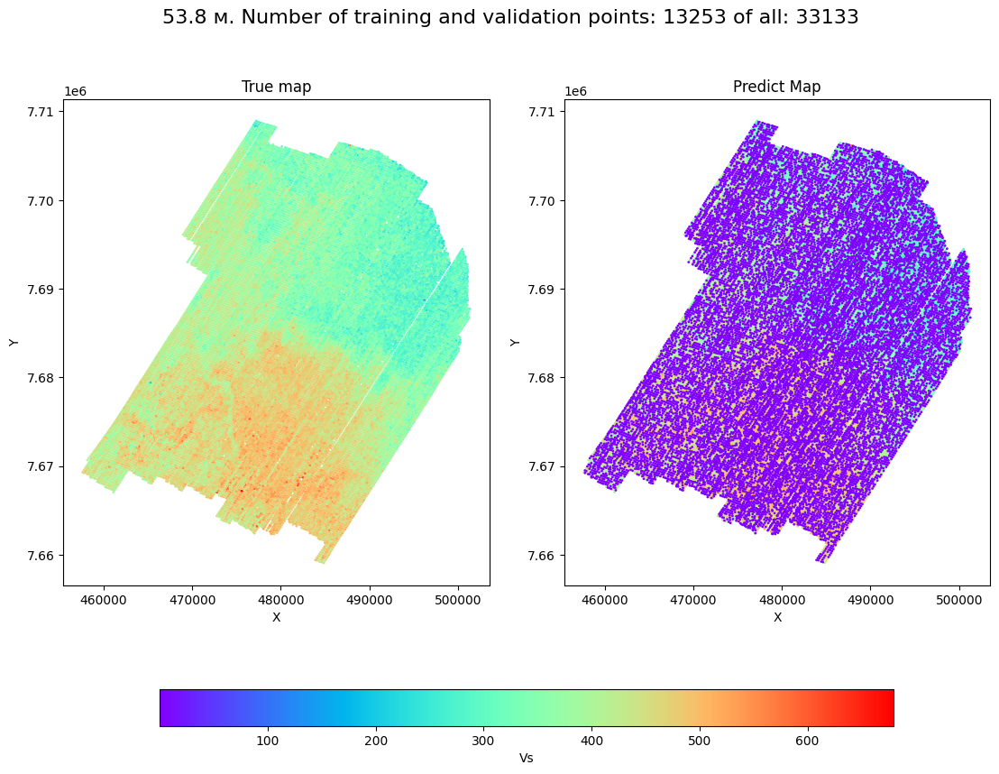

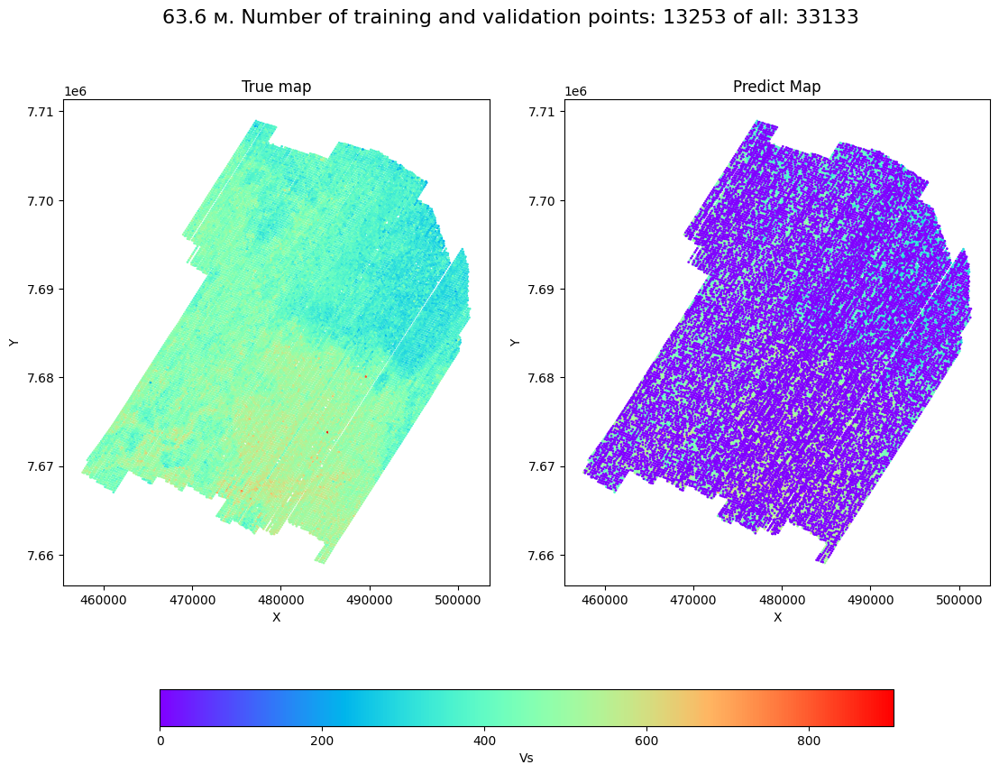

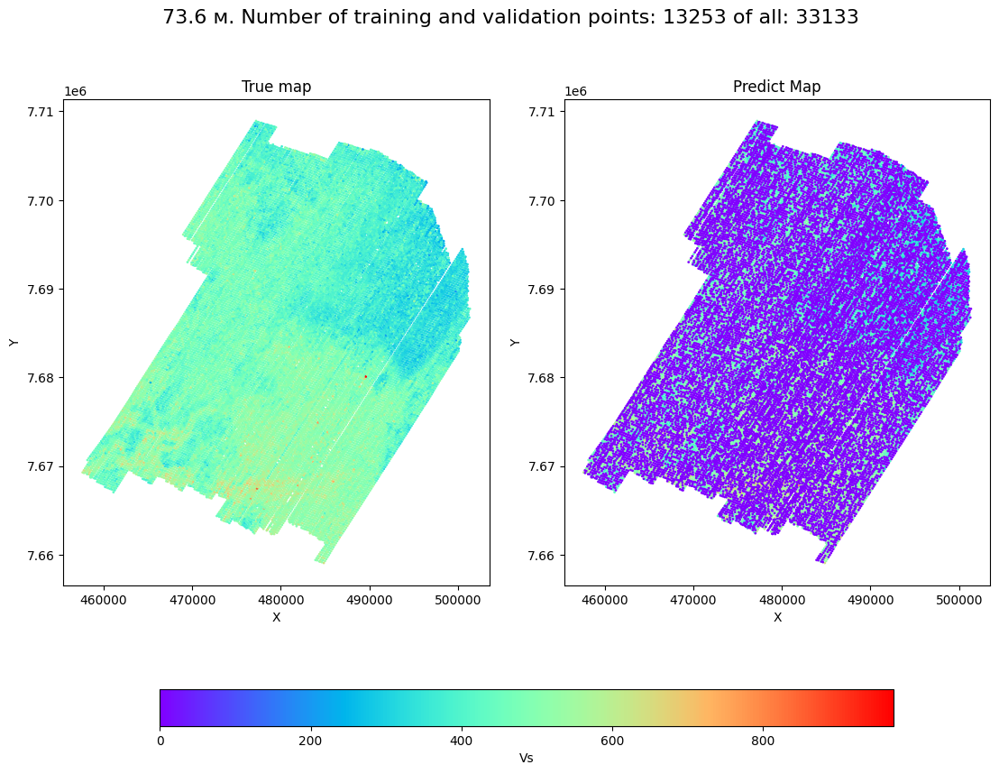

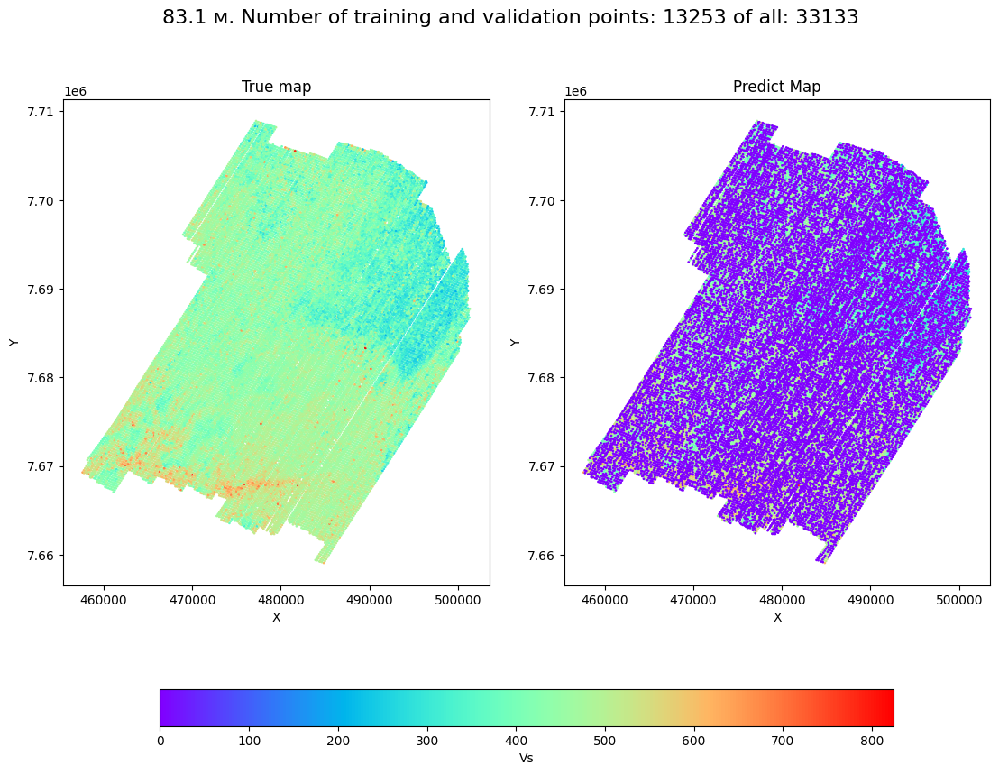

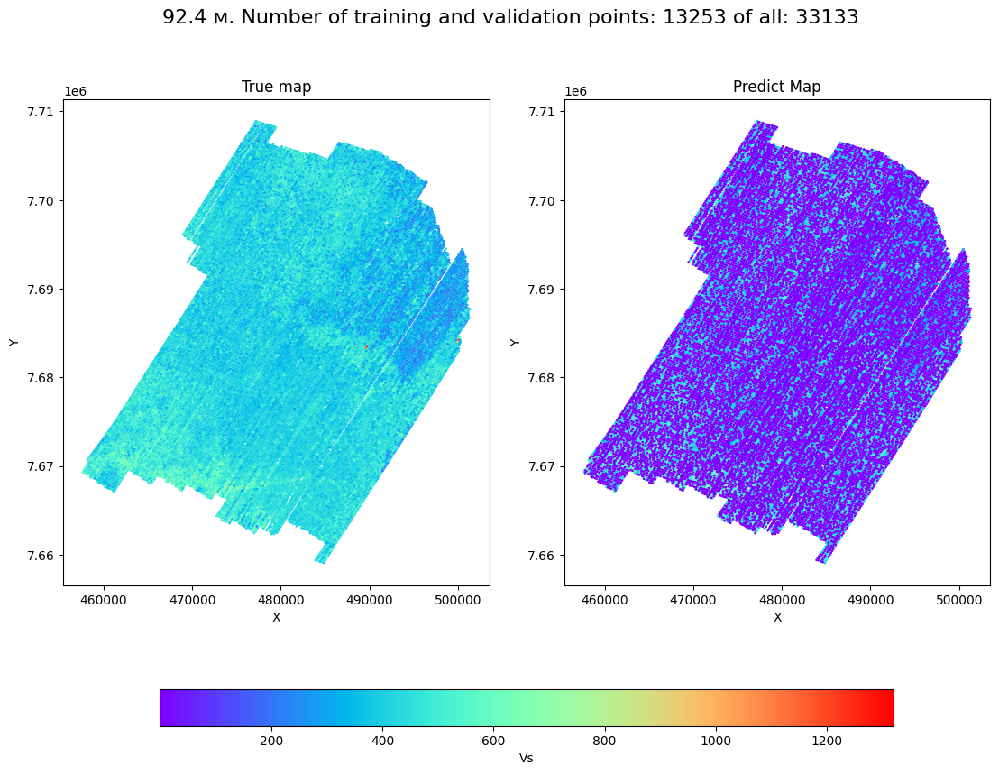

In [21]:
y_pred = None
with torch.no_grad():
    for X, y in test_dataloader:
        X, y = X.to(device), y.to(device)
        pred = model0(X).to("cpu").detach().numpy()
        if y_pred is None:
            y_pred = pred
        else:
            y_pred = np.concatenate([y_pred, pred])
depth_ar = [4.9, 14.6, 24.5, 34.2, 44.0, 53.8, 63.6, 73.6, 83.1, 92.4]
for i in range(10):
    true_slice = do_array_for_mapping(coord_train, coord_val, coord_test, y_train[:, i], y_val[:, i], y_test[:, i])
    pred_slice = do_array_for_mapping(coord_train, coord_val, coord_test, y_train[:, i], y_val[:, i], y_pred[:, i])
    our_map = plot_map(true_slice, pred_slice, depth_ar[i], X_train.shape[0], X_val.shape[0], X_test.shape[0])
    #our_map.savefig(f"../reports/figures/maps/{round(depth_ar[i])}map.png")
    plt.show(our_map)